In [2]:
# for inline image display inside notebook
# % matplotlib inline
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat
from skimage.io import imread, imsave, imshow, show, imread_collection,imshow_collection
from skimage import color, exposure, img_as_float, data
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc

CHƯƠNG 1

In [3]:
# Chapter 1

im = Image.open("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot.png") # read the image, provide thecorrect path
print(im.width, im.height, im.mode, im.format, type(im))
# 453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>
im.show() # display the image

453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>


<>:3: SyntaxWarning: invalid escape sequence '\L'
<>:3: SyntaxWarning: invalid escape sequence '\L'
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\1329745303.py:3: SyntaxWarning: invalid escape sequence '\L'
  im = Image.open("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot.png") # read the image, provide thecorrect path


In [4]:
im_g = im.convert('L') # convert the RGB color image to a grayscale image
im_g.save('D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot_gray.png') # save the image to disk
Image.open("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot_gray.png").show() # read the grayscale image from disk and show

<>:2: SyntaxWarning: invalid escape sequence '\L'
<>:3: SyntaxWarning: invalid escape sequence '\L'
<>:2: SyntaxWarning: invalid escape sequence '\L'
<>:3: SyntaxWarning: invalid escape sequence '\L'
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\647216158.py:2: SyntaxWarning: invalid escape sequence '\L'
  im_g.save('D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot_gray.png') # save the image to disk
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\647216158.py:3: SyntaxWarning: invalid escape sequence '\L'
  Image.open("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot_gray.png").show() # read the grayscale image from disk and show


<>:1: SyntaxWarning: invalid escape sequence '\L'
<>:1: SyntaxWarning: invalid escape sequence '\L'
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\3108783799.py:1: SyntaxWarning: invalid escape sequence '\L'
  im = mpimg.imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\hill.png") # read the image from disk as a numpy ndarray


(960, 1280, 4) float32 <class 'numpy.ndarray'>


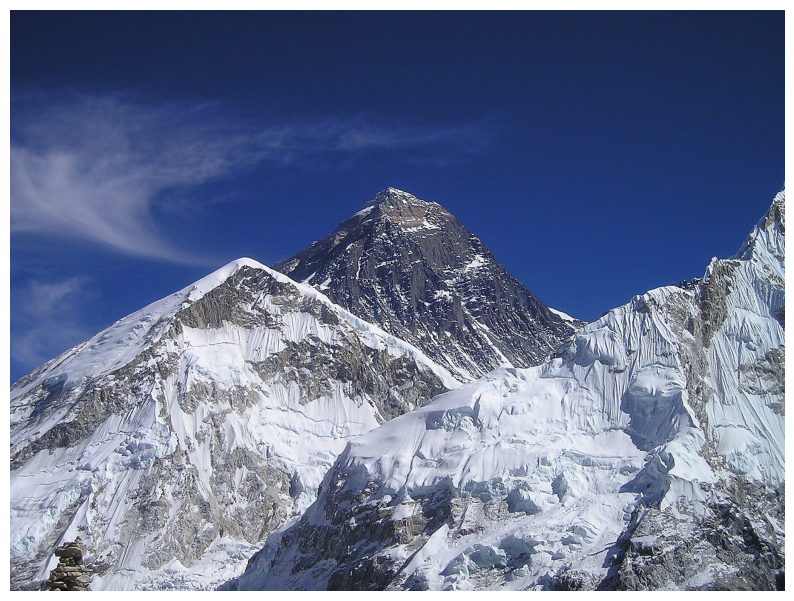

In [5]:
im = mpimg.imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\hill.png") # read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im)) # this image contains an α channel, hence num_channels= 4
# (960, 1280, 4) float32 <class 'numpy.ndarray'>
plt.figure(figsize=(10,10))
plt.imshow(im) # display the image
plt.axis('off')
plt.show()

<>:6: SyntaxWarning: invalid escape sequence '\L'
<>:7: SyntaxWarning: invalid escape sequence '\L'
<>:6: SyntaxWarning: invalid escape sequence '\L'
<>:7: SyntaxWarning: invalid escape sequence '\L'
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\1296087091.py:6: SyntaxWarning: invalid escape sequence '\L'
  plt.savefig("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\hill_dark.png") # save the dark image
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\1296087091.py:7: SyntaxWarning: invalid escape sequence '\L'
  im = mpimg.imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\hill_dark.png") # read the dark image


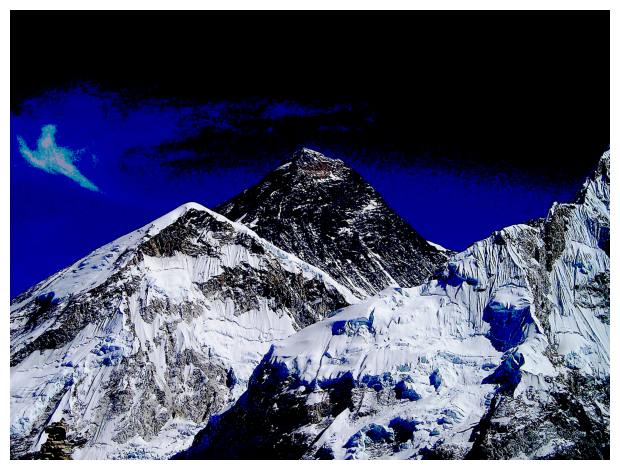

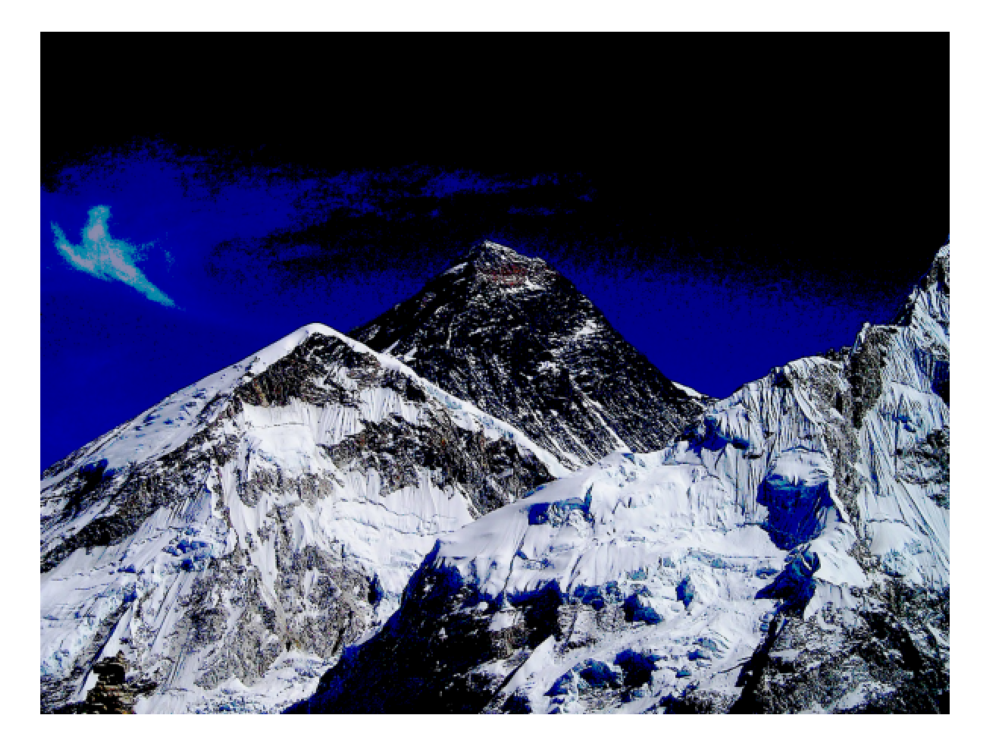

In [6]:
im1 = im
im1[im1 < 0.5] = 0 # make the image look darker
plt.imshow(im1)
plt.axis('off')
plt.tight_layout()
plt.savefig("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\hill_dark.png") # save the dark image
im = mpimg.imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\hill_dark.png") # read the dark image
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis('off') # no axis ticks
plt.tight_layout()
plt.show()

<>:4: SyntaxWarning: invalid escape sequence '\L'
<>:4: SyntaxWarning: invalid escape sequence '\L'
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\3488454161.py:4: SyntaxWarning: invalid escape sequence '\L'
  im = mpimg.imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\lena_small.jpg")


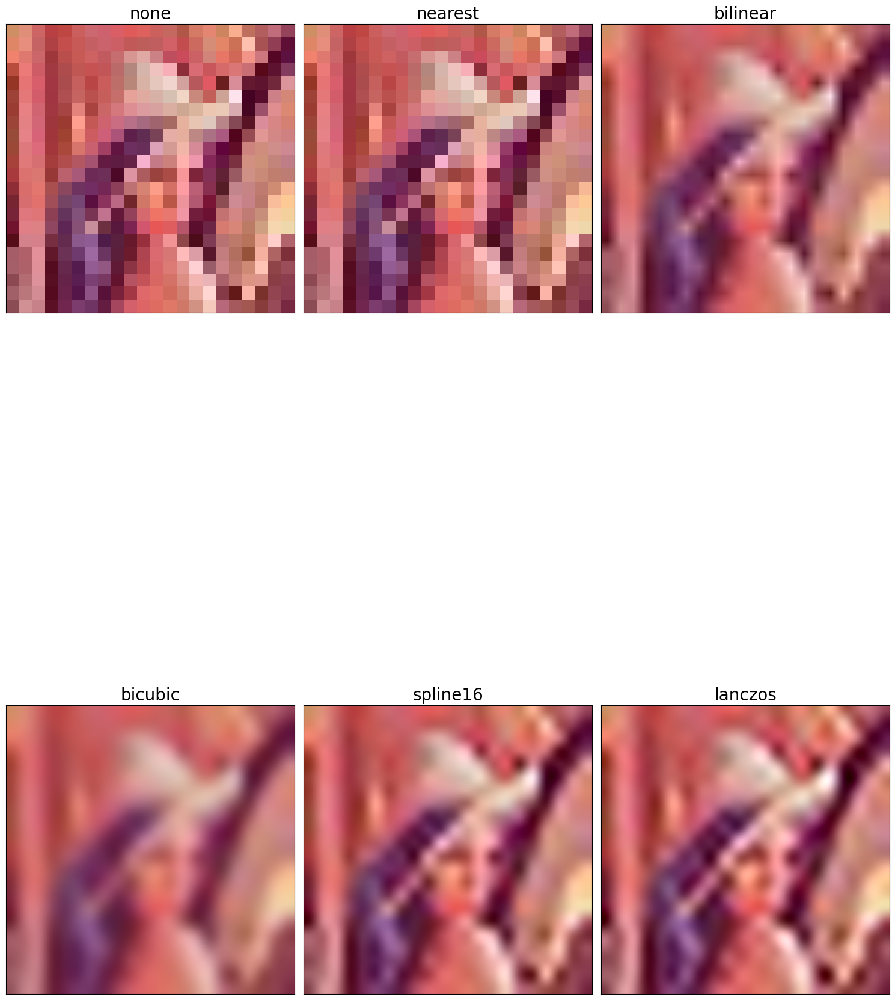

In [7]:
# Interpolating while displaying with Matplotlib imshow()

# Đọc ảnh từ đĩa dưới dạng mảng NumPy
im = mpimg.imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\lena_small.jpg")

# Các phương pháp nội suy
methods = ['none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'lanczos']

# Tạo lưới con 2x3 để hiển thị ảnh với các phương pháp nội suy khác nhau
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 30), 
                         subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)

# Hiển thị ảnh với từng phương pháp nội suy
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method)
    ax.set_title(str(interp_method), size=20)

# Bố cục chặt chẽ và hiển thị
plt.tight_layout()
plt.show()


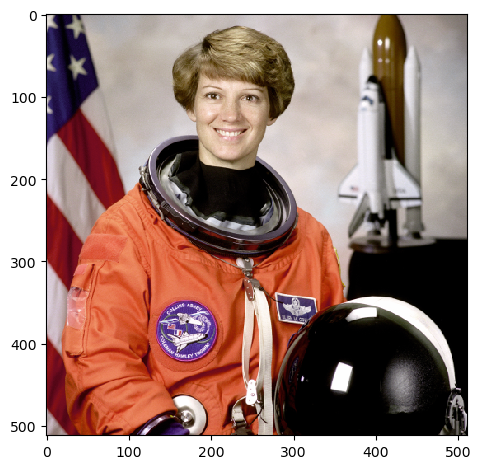

(<matplotlib.image.AxesImage at 0x1ccf509e300>, None)

In [8]:
# Using scikit-image's astronaut dataset

im = data.astronaut()
imshow(im), show()

<class 'numpy.ndarray'> (225, 225, 3) uint8


C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\3106338150.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\pepper.jpg')


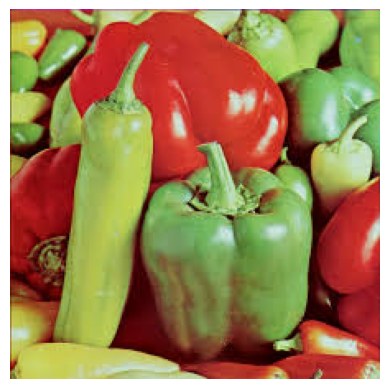

In [9]:
# Using scipy.misc's face dataset

import imageio
import matplotlib.pyplot as plt

# Đọc ảnh từ file
im = imageio.imread('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\pepper.jpg')

# Kiểm tra kiểu dữ liệu, kích thước của ảnh
print(type(im), im.shape, im.dtype)  # <class 'numpy.ndarray'> (225, 225, 3) uint8

# Hiển thị ảnh
plt.imshow(im)
plt.axis('off')  # Tắt trục tọa độ
plt.show()


In [10]:
# Dealing with different image types and file formats

im = Image.open("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot.png")
print(im.mode)
# RGB
im.save("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot.jpg")

RGB


<>:3: SyntaxWarning: invalid escape sequence '\L'
<>:6: SyntaxWarning: invalid escape sequence '\L'
<>:3: SyntaxWarning: invalid escape sequence '\L'
<>:6: SyntaxWarning: invalid escape sequence '\L'
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\1880768848.py:3: SyntaxWarning: invalid escape sequence '\L'
  im = Image.open("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot.png")
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\1880768848.py:6: SyntaxWarning: invalid escape sequence '\L'
  im.save("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot.jpg")


In [11]:

# Mở ảnh từ file
im = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\hill.png")

# Kiểm tra chế độ màu của ảnh
print(im.mode)  # RGBA

# Chuyển ảnh từ RGBA sang RGB và lưu lại dưới dạng .jpg
im.convert('RGB').save("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\hill.jpg")


RGBA


In [12]:
# Converting from one image mode into another

im = imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot.png", as_gray=True)
print(im.shape)
#(362L, 486L)

(340, 453)


<>:3: SyntaxWarning: invalid escape sequence '\L'
<>:3: SyntaxWarning: invalid escape sequence '\L'
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\3652954793.py:3: SyntaxWarning: invalid escape sequence '\L'
  im = imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\parrot.png", as_gray=True)


<>:1: SyntaxWarning: invalid escape sequence '\L'
<>:1: SyntaxWarning: invalid escape sequence '\L'
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\1114455186.py:1: SyntaxWarning: invalid escape sequence '\L'
  im = imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\Ishihara.png")


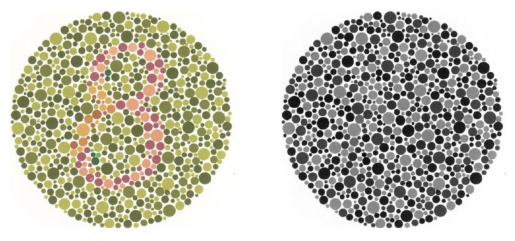

In [13]:
im = imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\Ishihara.png")
im_g = color.rgb2gray(im)
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

<>:3: SyntaxWarning: invalid escape sequence '\L'
<>:3: SyntaxWarning: invalid escape sequence '\L'
C:\Users\huytr\AppData\Local\Temp\ipykernel_7080\2270350744.py:3: SyntaxWarning: invalid escape sequence '\L'
  im = imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\mountain.png")


<Figure size 640x480 with 0 Axes>

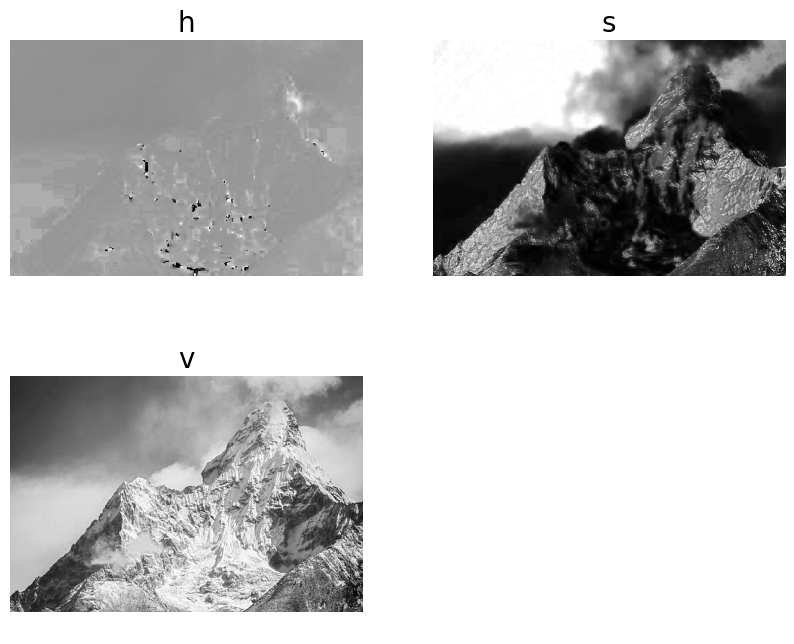

In [55]:
# Some color spaces (channels)

im = imread("D:\Learn DL\Xử lý ảnh\BTL\Sandipan_Dey_2018_Sample_Images\images\mountain.png")
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]), plt.title('h', size=20),
plt.axis('off')
plt.subplot(222), plt.imshow(im_hsv[...,1]), plt.title('s', size=20),
plt.axis('off')
plt.subplot(223), plt.imshow(im_hsv[...,2]), plt.title('v', size=20),
plt.axis('off')
plt.subplot(224), plt.axis('off')
plt.show()

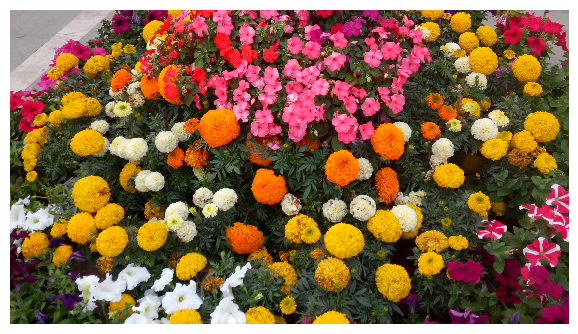

((-0.5, 4095.5, 2303.5, -0.5), None)

In [15]:
# Data structures to store images

im = Image.open('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\flowers.png') # read image into an Image object with PIL
im = np.array(im) # create a numpy ndarray from the Image object
imshow(im) # use skimage imshow to display the image
plt.axis('off'), show()

In [16]:
im = imread('D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\flowers.png') # read image into numpy ndarray with skimage
im = Image.fromarray(im) # create a PIL Image object from the numpy ndarray
im.show() # display the image with PIL Image.show() method

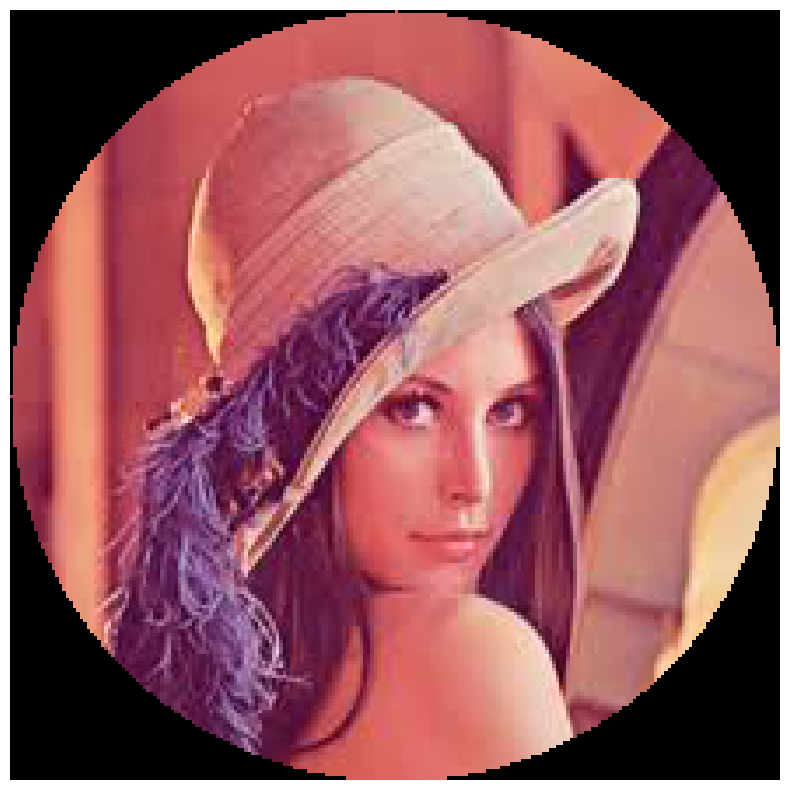

In [17]:
# Basic image manipulations

# Đọc ảnh từ đĩa
lena = mpimg.imread("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\lena.jpg")  # đọc ảnh

# Sao chép ảnh để có thể thay đổi
lena_copy = lena.copy()

# Lấy kích thước ảnh
lx, ly, _ = lena_copy.shape

# Tạo lưới tọa độ (X, Y)
X, Y = np.ogrid[0:lx, 0:ly]

# Tạo mặt nạ (mask) cho các pixel ngoài vùng tròn
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4

# Áp dụng mặt nạ và thay đổi các pixel ngoài vùng tròn thành màu đen
lena_copy[mask, :] = 0

# Hiển thị ảnh đã chỉnh sửa
plt.figure(figsize=(10, 10))
plt.imshow(lena_copy)
plt.axis('off')
plt.show()


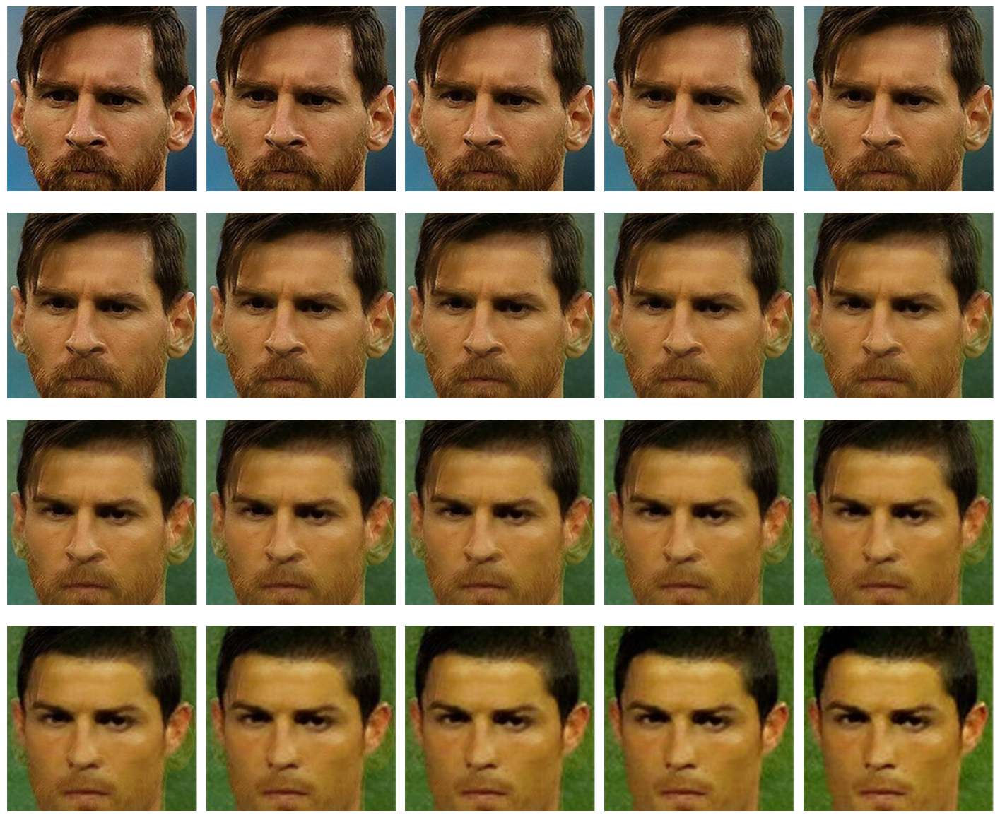

In [18]:
im1 = mpimg.imread("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\messi.jpg") / 255 # scale RGB values in [0,1]
im2 = mpimg.imread("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
 plt.subplot(4,5,i)
 plt.imshow((1-alpha)*im1 + alpha*im2)
 plt.axis('off')
 i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

In [19]:
# Image manipulations with PIL

im = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot.png") # open the image, provide the correct path
print(im.width, im.height, im.mode, im.format) # print image size, mode and format
# 486 362 RGB PNG

453 340 RGB PNG


In [20]:
im_c = im.crop((175,75,320,200)) # crop the rectangle given by (left, top, right, bottom) from the image
im_c.show()

In [21]:
# Resizing to a larger image

im = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\clock.jpg")
print(im.width, im.height)
# 107 105
im.show()

107 105


In [22]:
im_large = im.resize((im.width*5, im.height*5), Image.BILINEAR) # bi-linear interpolation

In [23]:
# Resizing to a smaller image

im = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\victoria_memorial.png")
print(im.width, im.height)
# 720 540
im.show()

720 540


In [24]:

# Resize ảnh xuống 1/5 kích thước ban đầu
im_small = im.resize((im.width // 5, im.height // 5), Image.Resampling.LANCZOS)



In [25]:
# Negating an image

im = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot.png")
im_t = im.point(lambda x: 255 - x)
im_t.show()

In [26]:
# Converting an image into grayscale

im_g = im.convert('L') # convert the RGB color image to a grayscale image
im_g.show()

In [27]:
# Log transformation 
# gray
im_g.point(lambda x: 255*np.log(1+x/255)).show()

In [28]:
# Power-law transformation
im_g.point(lambda x: 255*(x/255)**0.6).show()

In [29]:
# Reflecting an image
im.transpose(Image.FLIP_LEFT_RIGHT).show() # reflect about the vertical axis

In [30]:
# Rotating an image

im_45 = im.rotate(45) # rotate the image by 45 degrees
im_45.show() # show the rotated image

In [ ]:
# Applying an Affine transformation on an image

im = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot.png")
im.transform((int(1.4*im.width), im.height), Image.AFFINE,
data=(1,-0.5,0,0,1,0)).show() # shear

In [63]:
# Perspective transformation

params = [1, 0.1, 0, -0.1, 0.5, 0, -0.005, -0.001]
im1 = im.transform((im.width//3, im.height), Image.PERSPECTIVE, params,
Image.BICUBIC)
im1.show()

In [72]:
# Adding salt and pepper noise to an image

# choose 5000 random locations inside image
imm = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\house2.png")
im1 = imm.copy() # keep the original image, create a copy
n = 5000
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height,n)
for (x,y) in zip(x,y):
 im1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # salt-and-pepper noise
im1.show()

In [34]:
# Drawing on an image

im = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot.png")
draw = ImageDraw.Draw(im)
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128))
del draw
im.show()

In [35]:
# Drawing text on an image

draw = ImageDraw.Draw(im)
font = ImageFont.truetype("arial.ttf", 23) # use a truetype font
draw.text((10, 5), "Tran Van Huy", font=font)
del draw
im.show()

In [36]:
# Creating a thumbnail

im_thumbnail = im.copy() # need to copy the original image first
im_thumbnail.thumbnail((100,100))
# now paste the thumbnail on the image
im.paste(im_thumbnail, (10,10))
im.save("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot_thumb.jpg")
im.show()

In [37]:
# Computing the basic statistics of an image

s = stat.Stat(im)
print(s.extrema) # maximum and minimum pixel values for each channel R, G, B
# [(4, 255), (0, 255), (0, 253)]
print(s.count)
# [154020, 154020, 154020]
print(s.mean)
# [125.41305674587716, 124.43517724970783, 68.38463186599142]
print(s.median)
# [117, 128, 63]
print(s.stddev)
# [47.56564506512579, 51.08397900881395, 39.067418896260094]

[(0, 255), (0, 255), (0, 255)]
[154020, 154020, 154020]
[132.67609401376444, 135.806616023893, 79.70220750551876]
[122, 137, 66]
[54.88290228395102, 56.28602100537281, 56.66782949738304]


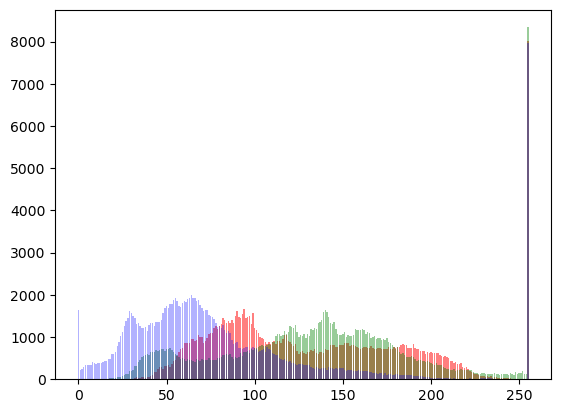

In [38]:
# Plotting the histograms of pixel values for the RGB channels of an image

pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

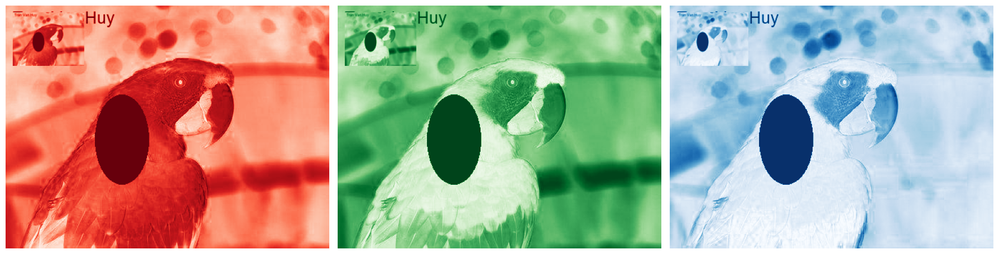

In [39]:
# Separating the RGB channels of an image

ch_r, ch_g, ch_b = im.split() # split the RGB image into 3 channels: R, G and B
# we shall use matplotlib to display the channels
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=plt.cm.Reds); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=plt.cm.Greens); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=plt.cm.Blues); plt.axis('off')
plt.tight_layout()
plt.show() # show the R, G, B channels

In [40]:
# Combining multiple channels of an image

im = Image.merge('RGB', (ch_b, ch_g, ch_r)) # swap the red and blue channels obtained last time with split()
im.show()

In [41]:
# α-blending two images

im1 = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot.png")
im2 = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\hill.png")
# 453 340 1280 960 RGB RGBA
im1 = im1.convert('RGBA') # two images have different modes, must be converted to the same mode
im2 = im2.resize((im1.width, im1.height), Image.BILINEAR) # two images have different sizes, must be converted to the same size
im = Image.blend(im1, im2, alpha=0.5).show()

In [42]:
# Superimposing two images

im1 = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot.png")
im2 = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\hill.png").convert('RGB').resize((im1.width,im1.height))
multiply(im1, im2).show()

In [43]:
# Adding two images

add(im1, im2).show()

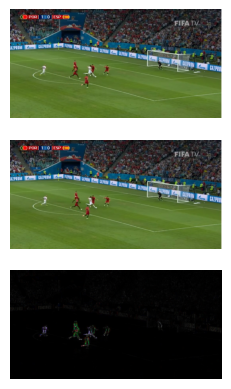

In [44]:
# Computing the difference between two images

from PIL.ImageChops import subtract, multiply, screen, difference, add
im1 = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\goal1.png") # load two consecutive frame images from the video
im2 = Image.open("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\goal2.png")
im = difference(im1, im2)
im.save("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\goal_diff.png")
plt.subplot(311)
plt.imshow(im1)
plt.axis('off')
plt.subplot(312)
plt.imshow(im2)
plt.axis('off')
plt.subplot(313)
plt.imshow(im), plt.axis('off')
plt.show()

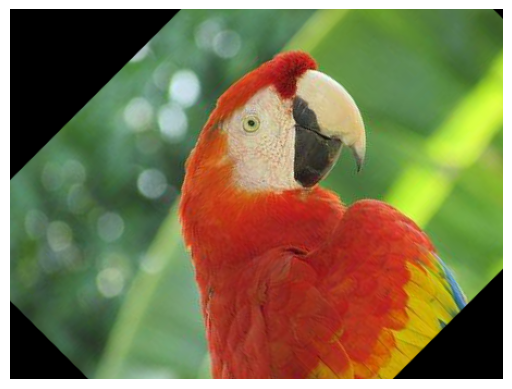

(<matplotlib.image.AxesImage at 0x1cc823aa360>,
 (-0.5, 452.5, 339.5, -0.5),
 None)

In [45]:
# Subtracting two images and superimposing two image negatives
# Applying an Affine transformation on an image

im = imread("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot.png")
tform = SimilarityTransform(scale=0.9,
rotation=np.pi/4,translation=(im.shape[0]/2, -100))
warped = warp(im, tform)
import matplotlib.pyplot as plt
plt.imshow(warped), plt.axis('off'), plt.show()

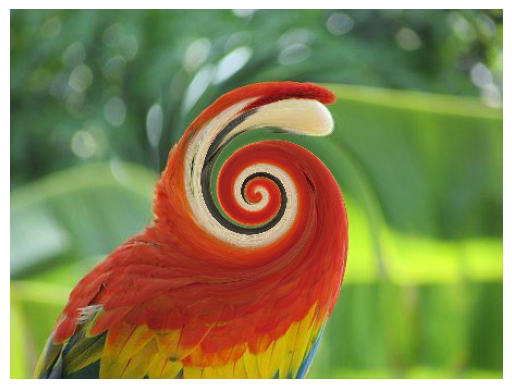

In [46]:
# Applying the swirl transform

im = imread("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot.png")
swirled = swirl(im, rotation=0, strength=15, radius=200)
plt.imshow(swirled)
plt.axis('off')
plt.show()

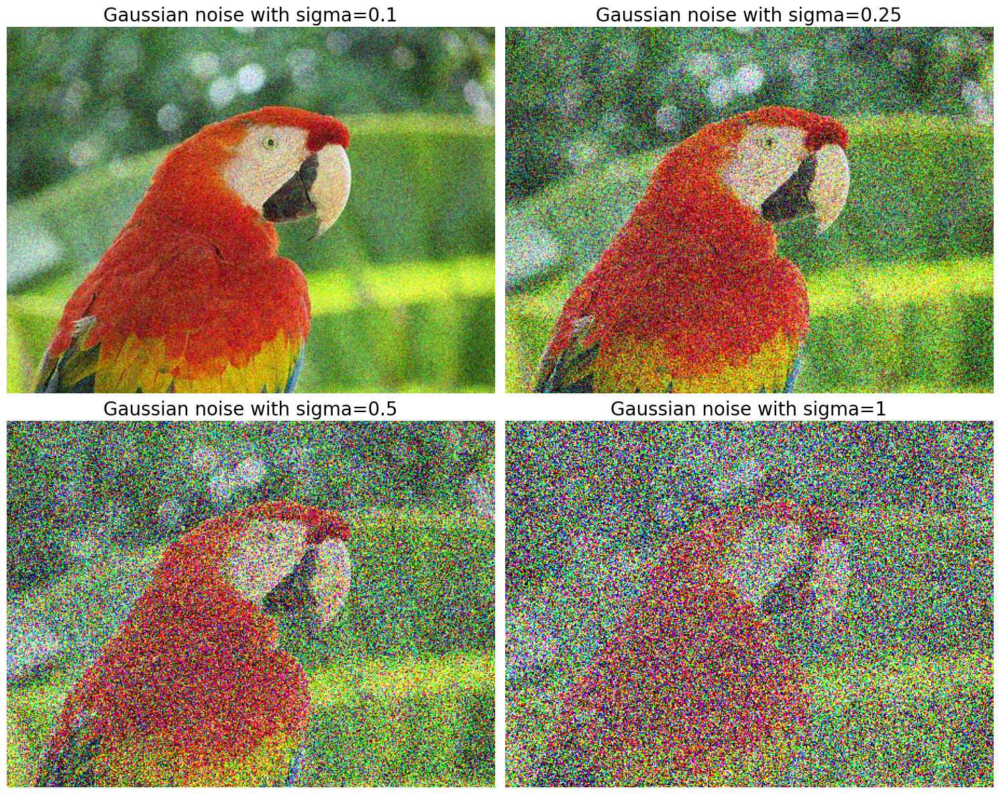

In [47]:
# Adding random Gaussian noise to images

im = img_as_float(imread("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\parrot.png"))
plt.figure(figsize=(15,12))
sigmas = [0.1, 0.25, 0.5, 1]
for i in range(4):
 noisy = random_noise(im, var=sigmas[i]**2)
 plt.subplot(2,2,i+1)
 plt.imshow(noisy)
 plt.axis('off')
 plt.title('Gaussian noise with sigma=' + str(sigmas[i]), size=20)
plt.tight_layout()
plt.show()

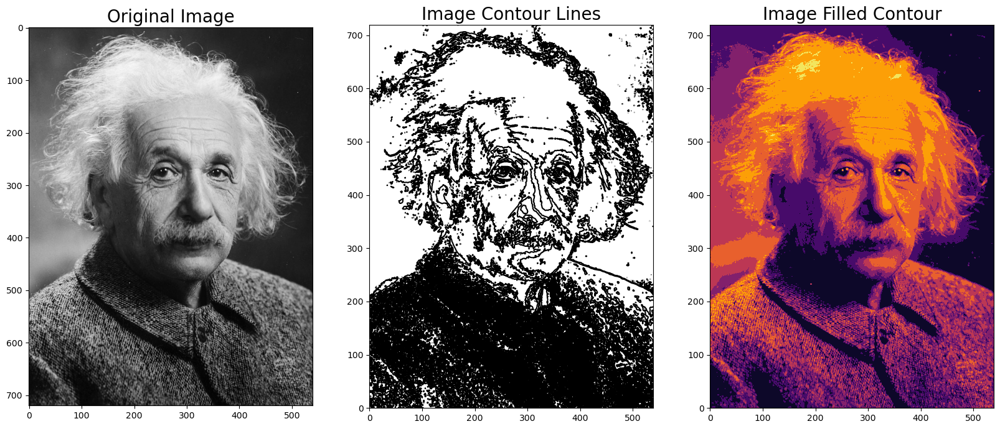

In [48]:
# Image manipulation with Matplotlib
# Drawing contour lines for an image

from skimage.color import rgb2gray

# Đọc ảnh từ đĩa
im = imread("D:\\Learn DL\\Xử lý ảnh\\BTL\\Sandipan_Dey_2018_Sample_Images\\images\\einstein.jpg")

# Kiểm tra nếu ảnh có 3 kênh (RGB), nếu không thì bỏ qua bước chuyển đổi rgb2gray
if im.ndim == 3 and im.shape[2] == 3:
    im = rgb2gray(im)

# Tạo figure với kích thước lớn
plt.figure(figsize=(20, 8))

# Hiển thị ảnh gốc
plt.subplot(131)
plt.imshow(im, cmap='gray')
plt.title('Original Image', size=20)

# Vẽ các đường đồng mức (contour lines)
plt.subplot(132)
plt.contour(np.flipud(im), colors='k', levels=np.logspace(-15, 15, 100))
plt.title('Image Contour Lines', size=20)

# Vẽ các vùng đồng mức được điền màu (filled contour)
plt.subplot(133)
plt.contourf(np.flipud(im), cmap='inferno')
plt.title('Image Filled Contour', size=20)

# Hiển thị các hình ảnh
plt.show()
